In [1]:
from SFstarred.DataStarredv2 import DataStarred
import matplotlib.pyplot as plt
from matplotlib.colors import SymLogNorm, LogNorm, Normalize, TwoSlopeNorm
import numpy as np

/home/favila/miniforge3/envs/starred/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
%load_ext autoreload
%autoreload 2

## Overview

In this notebook, I summarize the main features used to read HST images, select lens systems, cut out stars, and save the resulting data products.

In [ ]:
path_data = "HST_IMAGES_0214_2105/WG0214-2105_F160W_drz_sci.fits"
path_weight = "HST_IMAGES_0214_2105/WG0214-2105_F160W_drz_wht.fits"
# Data setup for starred
#remove_star: 5 (light contamination from other source), 8 (it is one of the QSO images); 9 (large residuals) 
data_F160W = DataStarred(path_data,path_weight)

for the cut out

values use for fwhm = 3 and threshold = 0.1


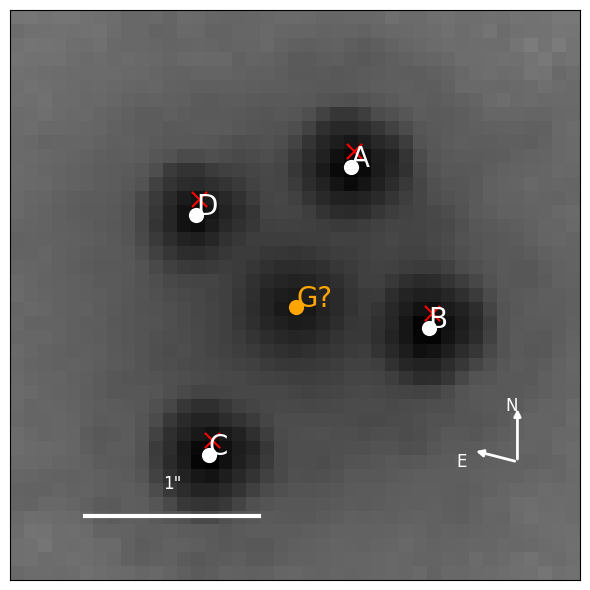

In [24]:
data_F160W.cut_out_lens(times_maxsep=1.9, plot=True, refine_centers=True, centroid_box_size=15, centroid_method="2dg",num_pix=41,detec_fwhm=3,threshold = 0.1)

Multiples ways to detect stars

The search for stars will be with detec_fwhm = 5.000 and threshold = 0.543
Using 1 Gaia stars in the field.
Refined 1 star centers. Failed: 0
Detected 1 stars outside the object region.


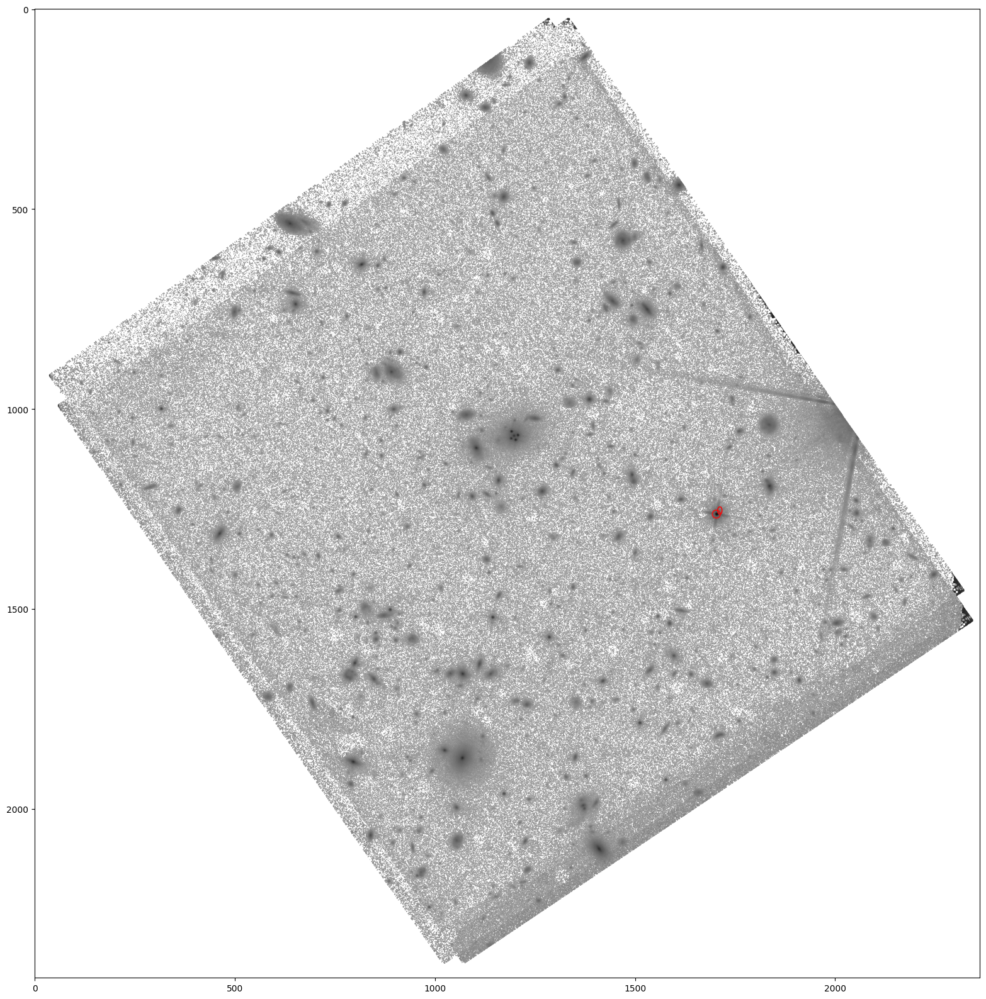

In [26]:
stat_stars = data_F160W.detect_stars(detec_fwhm=None,threshold=None,verbose=True,make_plots=True,star_num_pix=41,n_keep=20,binary_dilation_iteration=20,use_gaia=True,gaia_gmag_limit=20,gaia_radius=None,)

The search for stars will be with detec_fwhm = 5.000 and threshold = 0.543
Refined 20 star centers. Failed: 0
Detected 20 stars outside the object region.


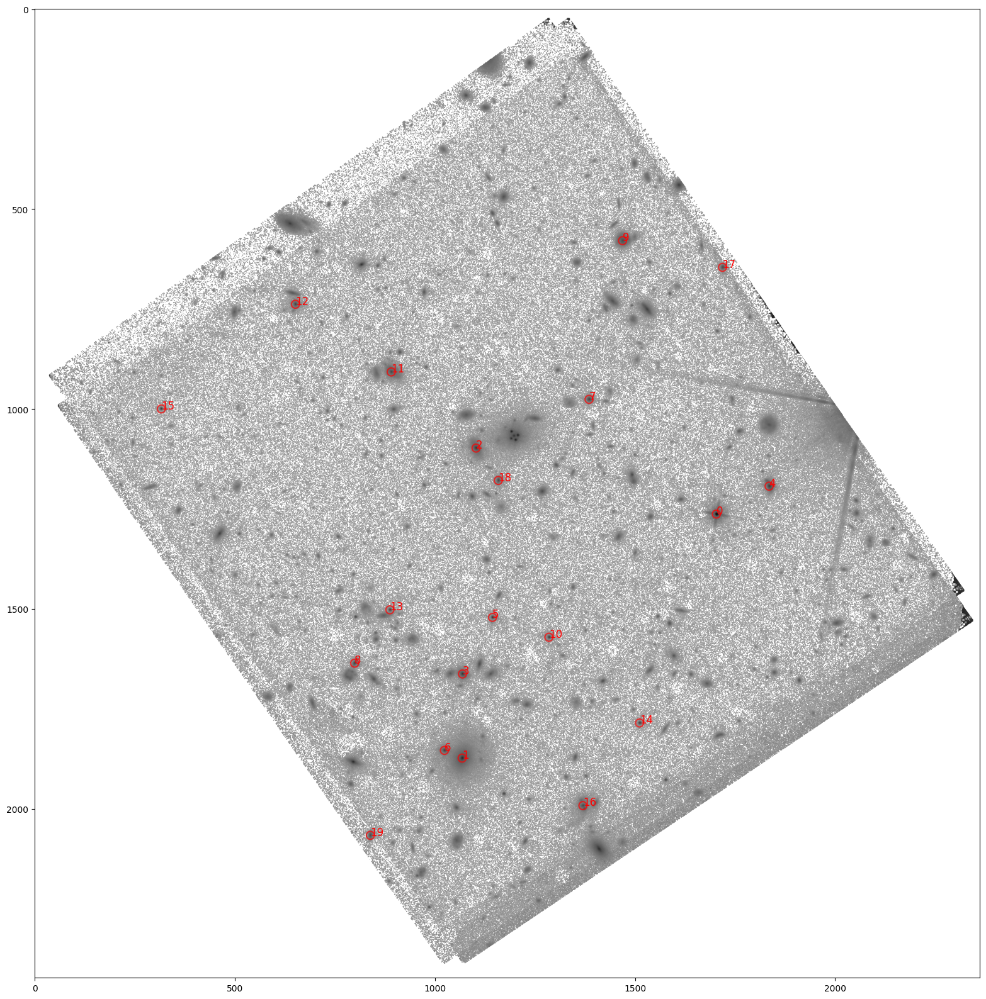

In [8]:
stat_stars = data_F160W.detect_stars(detec_fwhm=None,threshold=None,verbose=True,make_plots=True,star_num_pix=41,n_keep=20,binary_dilation_iteration=20,use_gaia=False,gaia_gmag_limit=20,gaia_radius=None,)

check the stars with 

ra, dec: [ 33.55612615 -21.08880745]


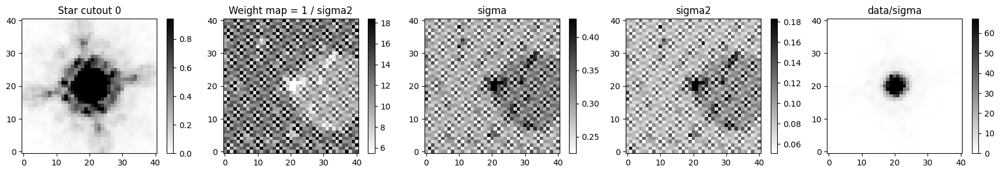

In [27]:
data_F160W.plot_stars()

Using a catalog of stars provided as a `.reg` file, this routine cross-matches the catalog positions with stars detected in the image field. The lens system is already masked through `cut_out_lens`, preventing it from being selected as a stellar source.

In [28]:
region_path = "HST_IMAGES_0214_2105/reg_without_system_more.reg"

In [35]:
sources

id,x_centroid,y_centroid,sharpness,roundness1,roundness2,n_pixels,peak,flux,mag,daofind_mag
int64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64
57,1143.929190631902,1521.1595152309312,0.8886111720195431,0.04650755986229439,-0.031167085120345897,49,10.22576978802681,86.64265260100365,-4.844329349819469,-3.3224118563517377
77,1511.3896004404723,1785.133031677171,0.6249358021911694,0.10530114931990683,-0.042347996264075136,49,3.8161971867084503,50.542132288217545,-4.259133900324618,-2.457115978092321
46,1703.3717210665402,1262.8569814972789,0.7690884481512964,-0.07664551351538253,-0.047054279674913144,49,152.22167947888374,1470.4843762218952,-7.918651036309243,-6.367098598605152
63,1284.8725171918413,1570.7668564519026,0.7500738156766109,0.13537215829360047,0.015515843247771612,49,6.009380608797073,60.32822388410568,-4.451301348734127,-2.8718867784733604
56,801.5510520149417,1519.949150579106,0.8904567190164069,-0.0055599051738601905,-0.12960391812735267,49,3.069621831178665,26.204534217715263,-3.5459411114441903,-2.013294215199477
83,1171.8203964132158,1962.1576331785957,0.9319675344235311,0.07604109481004591,-0.024996197669463496,49,4.0959265530109406,33.622357577085495,-3.816570406519864,-2.2873895551694194
28,316.30499569650766,999.6244706501717,0.8335687706308686,-0.16309168046830208,-0.012522325674053864,49,5.639456063508987,50.245722115039825,-4.252747730359739,-2.7293464033195374
27,1385.1659101017308,975.7944826205688,0.6019441278986607,0.0645598016455888,0.05298277575689803,49,3.3391158878803253,63.22903594374657,-4.5022914003853725,-2.145441674911262


The search for stars will be with detec_fwhm = 5.000 and threshold = 0.543
Refined 8 star centers. Failed: 0
Detected 8 stars outside the object region.


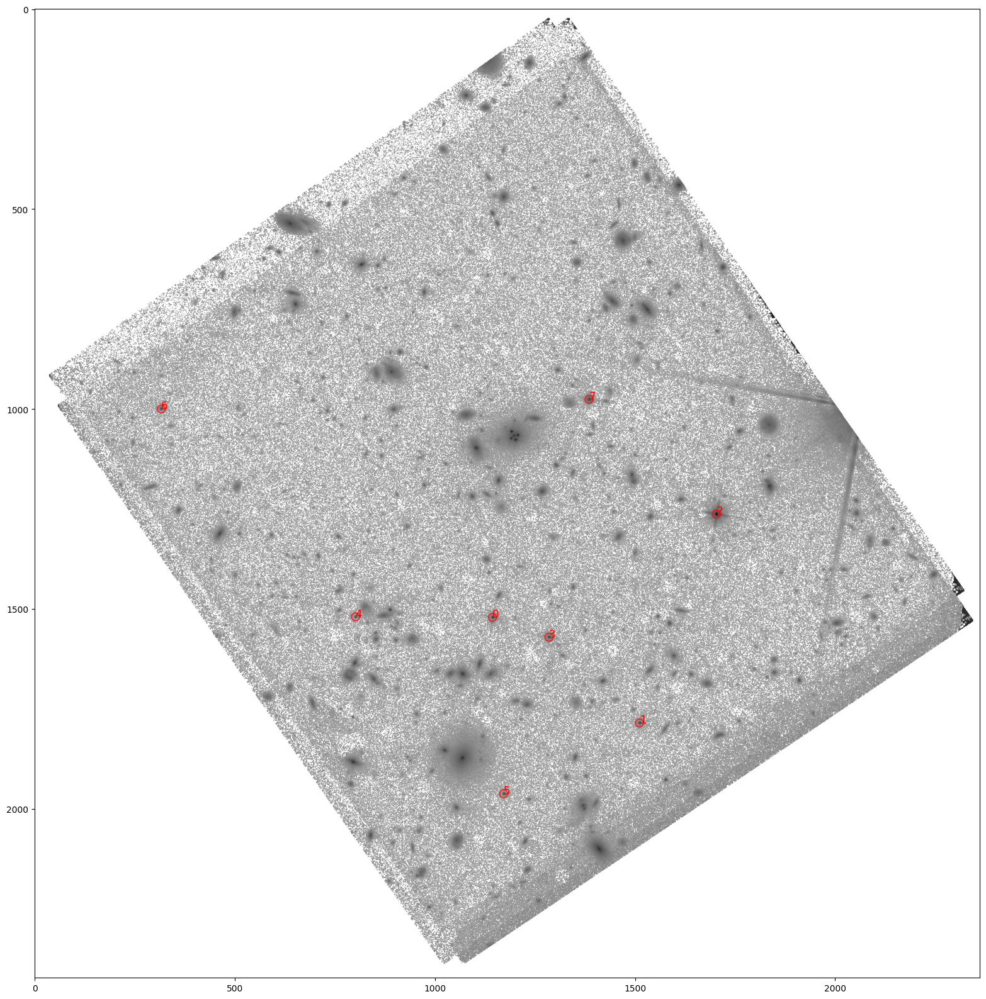

In [34]:
sources = data_F160W.from_region(region_path,detec_fwhm=None,threshold=None,verbose=True,make_plots=True,star_num_pix = 41)

ra, dec: [ 33.56945147 -21.08306589]


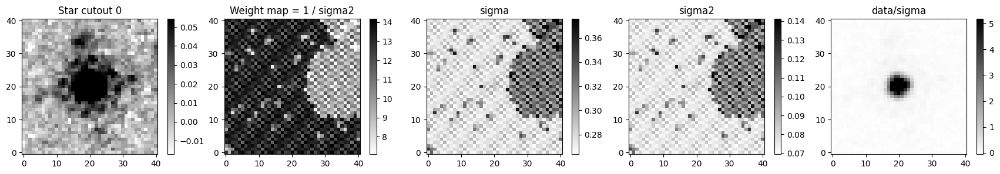

ra, dec: [ 33.56069988 -21.07719969]


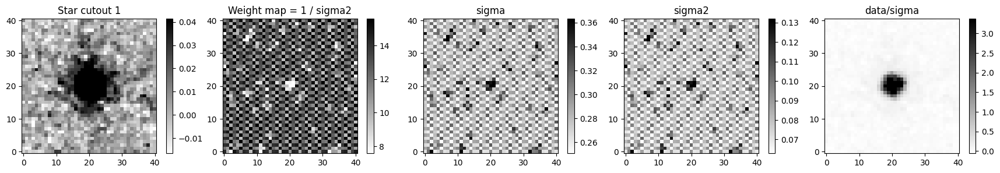

ra, dec: [ 33.55612669 -21.08880735]


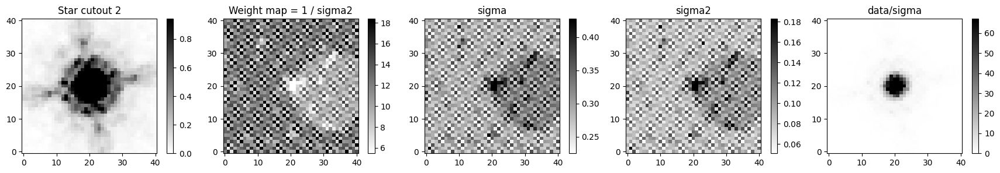

ra, dec: [ 33.56609496 -21.08196412]


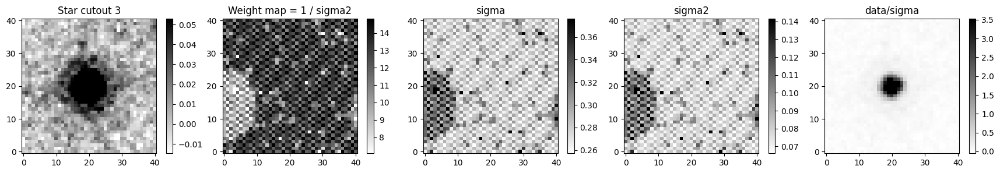

ra, dec: [ 33.5776049  -21.08309289]


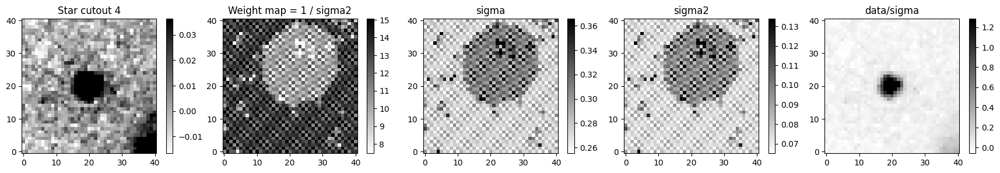

ra, dec: [ 33.56878817 -21.07326634]


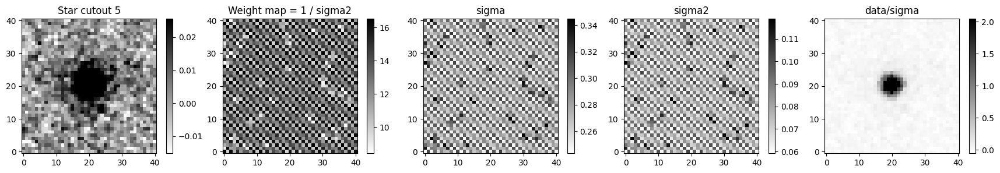

ra, dec: [ 33.58916331 -21.09465439]


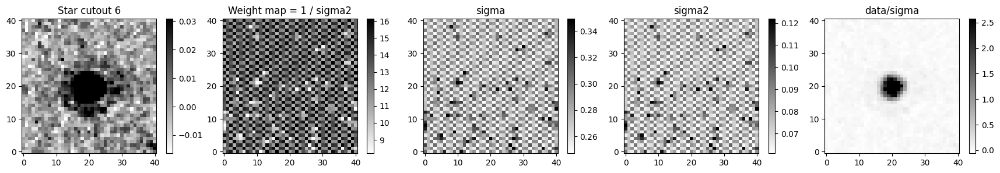

ra, dec: [ 33.56370538 -21.09518388]


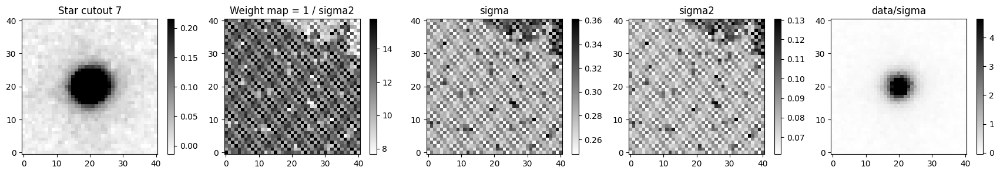

In [36]:
data_F160W.plot_stars()

### Finally to save 

ra, dec: [ 33.56945147 -21.08306589]


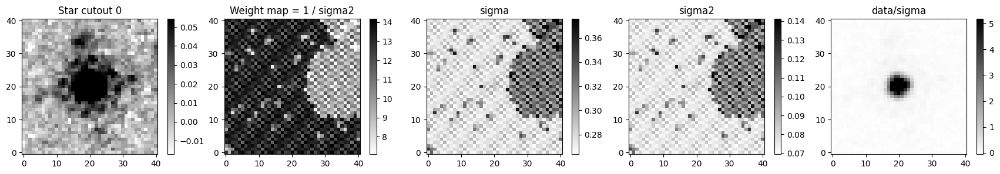

ra, dec: [ 33.56069988 -21.07719969]


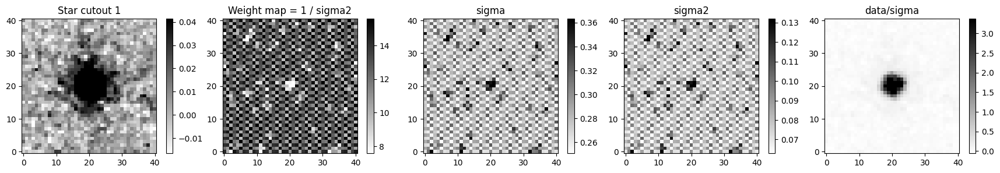

ra, dec: [ 33.56609496 -21.08196412]


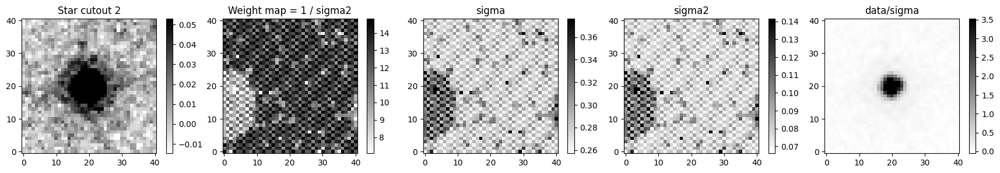

ra, dec: [ 33.58916331 -21.09465439]


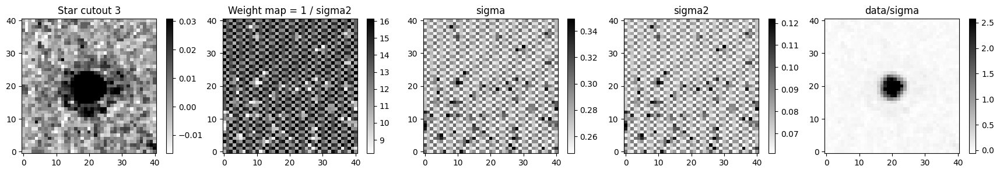

In [37]:
dict_result = data_F160W.save_for_starred(do_plots=True,non_selected_stars_index=[2,4,5,7,8],verbose=False,save_path="data_for_starred/data_for_starred_F160_0214.pickle")

### read the data 

In [20]:
import pandas as pd 

In [22]:
dict_result_read = pd.read_pickle("data_for_starred/data_for_starred_F160_0214.pickle")

In [35]:
dict_result_read.keys()

dict_keys(['data', 'data_weight', 'data_noisemaps', 'stars', 'noisemaps_stars', 'coord_pix_images', 'images_names', 'coord_pix_images_dict', 'selected_star_indices', 'non_selected_stars_index', 'norm_factor'])